In [33]:
import pandas as pd
import numpy as np
import xgboost as xgb
import matplotlib.pyplot as plt
import math
import time
from datetime import datetime
from sklearn.model_selection import cross_val_score,KFold
from sklearn.model_selection import  train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_validate, cross_val_predict
from pandas.plotting import scatter_matrix
from sklearn import preprocessing
%matplotlib inline
import seaborn as sns

In [43]:
myData = pd.read_csv('data/baoding.csv')

In [3]:
myData

,Unnamed: 0,date,X,PM25,PM10,CO,NO2,SO2,O3,year,...,extremews,extremewswd,daylight,precipitation,avgp,maxp,minp,avggt,maxgt,mingt
0,1,2014-01-01,2.0,127.70,533.00,5200.0,78.84,61.4,30.00,2014,...,8.6,14,8.4,0.0,101300.0,101530.0,101120.0,1.0,21.4,-6.7
1,2,2014-01-02,3.0,305.50,463.40,5200.0,65.96,46.2,26.25,2014,...,4.8,11,6.2,0.0,101590.0,101840.0,101370.0,-0.8,15.1,-7.9
2,3,2014-01-03,4.0,279.50,394.90,3330.0,65.04,48.6,12.50,2014,...,9.2,4,7.6,0.0,101990.0,102310.0,101510.0,-1.9,16.2,-8.9
3,4,2014-01-04,5.0,247.50,437.00,3870.0,77.92,56.6,17.50,2014,...,6.8,2,6.8,0.0,102020.0,102380.0,101670.0,-1.9,14.8,-9.6
4,5,2014-01-05,6.0,273.50,363.40,3060.0,56.76,47.8,10.00,2014,...,5.7,3,7.2,0.0,102230.0,102430.0,101820.0,-3.2,15.3,-10.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2672,2673,2021-04-26,2664.0,34.09,197.00,180.0,11.88,2.1,60.00,2021,...,7.3,8,8.5,NaN,101450.0,102060.0,101010.0,22.4,47.7,11.0
2673,2674,2021-04-27,2665.0,43.10,61.00,180.0,12.96,2.8,55.00,2021,...,12.8,14,6.9,0.0,101220.0,101360.0,100910.0,24.7,50.1,6.2
2674,2675,2021-04-28,2666.0,22.81,91.00,180.0,14.04,2.8,56.25,2021,...,11.7,12,12.6,0.0,101270.0,101700.0,100670.0,24.4,52.4,3.8
2675,2676,2021-04-29,2667.0,27.98,69.00,NaN,17.28,3.5,38.75,2021,...,16.4,16,10.2,0.0,100130.0,100690.0,99900.0,20.1,49.1,7.9


In [4]:
myData.columns

Index(['Unnamed: 0', 'date', 'X', 'PM25', 'PM10', 'CO', 'NO2', 'SO2', 'O3',
       'year', 'month', 'day', 'week', 'season', 'covid', 'city', 'region',
       'avgtemp', 'maxtemp', 'mintemp', 'avgrh', 'minrh', 'avgws', 'maxws',
       'maxwswd', 'extremews', 'extremewswd', 'daylight', 'precipitation',
       'avgp', 'maxp', 'minp', 'avggt', 'maxgt', 'mingt'],
      dtype='object')

I. Data cleaning stage...

In [7]:
## 1. check the data types in this data frame
myData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2677 entries, 0 to 2676
Data columns (total 35 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     2677 non-null   int64  
 1   date           2677 non-null   object 
 2   X              2667 non-null   float64
 3   PM25           2644 non-null   float64
 4   PM10           2630 non-null   float64
 5   CO             2449 non-null   float64
 6   NO2            2660 non-null   float64
 7   SO2            2660 non-null   float64
 8   O3             2626 non-null   float64
 9   year           2677 non-null   int64  
 10  month          2677 non-null   int64  
 11  day            2677 non-null   int64  
 12  week           2677 non-null   int64  
 13  season         2667 non-null   object 
 14  covid          2667 non-null   object 
 15  city           2667 non-null   object 
 16  region         2667 non-null   object 
 17  avgtemp        2675 non-null   float64
 18  maxtemp 

In [10]:
myData.covid.value_counts()

1.pre     2206
3.post     365
2.ing       96
Name: covid, dtype: int64

In [9]:
## 2. identification and removal of outliers
myData.describe()

,Unnamed: 0,X,PM25,PM10,CO,NO2,SO2,O3,year,month,...,extremews,extremewswd,daylight,precipitation,avgp,maxp,minp,avggt,maxgt,mingt
count,2677.000000,2667.000000,2644.000000,2630.000000,2449.000000,2660.000000,2660.000000,2626.000000,2677.000000,2677.000000,...,2677.000000,2677.000000,2675.000000,2673.000000,2676.000000,2677.000000,2677.000000,2675.000000,2677.000000,2677.000000
mean,1339.000000,1335.000000,99.243177,171.615662,1413.674969,30.810647,15.294887,65.287833,2017.180052,6.342174,...,7.665260,7.807994,5.324075,1.320801,101512.092676,101786.286888,101197.586851,15.275327,32.068958,5.744191
std,772.927659,770.040908,81.717916,110.903602,1448.878641,17.208331,15.565052,40.674696,2.123188,3.480705,...,3.262646,4.294350,4.237869,6.400588,1023.764408,1063.281910,1007.108815,13.044133,16.064675,11.995240
min,1.000000,2.000000,11.520000,18.870000,90.000000,3.240000,1.400000,1.250000,2014.000000,1.000000,...,1.800000,1.000000,0.000000,0.000000,99260.000000,99380.000000,99010.000000,-11.700000,-0.800000,-21.900000
25%,670.000000,668.500000,42.700000,89.000000,540.000000,19.440000,4.900000,32.500000,2015.000000,3.000000,...,5.300000,4.000000,0.000000,0.000000,100610.000000,100830.000000,100330.000000,2.600000,17.900000,-5.000000
50%,1339.000000,1335.000000,65.000000,141.000000,900.000000,25.920000,9.800000,53.750000,2017.000000,6.000000,...,7.000000,8.000000,6.200000,0.000000,101530.000000,101820.000000,101210.000000,16.500000,33.100000,6.100000
75%,2008.000000,2001.500000,137.200000,219.000000,1710.000000,37.800000,20.300000,96.250000,2019.000000,9.000000,...,9.300000,11.000000,9.000000,0.000000,102330.000000,102650.000000,101990.000000,26.800000,44.500000,16.600000
max,2677.000000,2668.000000,499.000000,598.000000,13940.000000,120.800000,180.600000,186.600000,2021.000000,12.000000,...,35.100000,16.000000,13.800000,120.500000,104210.000000,104490.000000,104050.000000,40.500000,70.200000,28.300000


In [24]:
## 3. missing values
myData[myData.isnull().T.any()] ## rows contain empty values -- can be from one or multiple columns

,Unnamed: 0,date,X,PM25,PM10,CO,NO2,SO2,O3,year,...,extremews,extremewswd,daylight,precipitation,avgp,maxp,minp,avggt,maxgt,mingt
0,1,2014-01-01,2.0,127.70,533.0,5200.0,78.84,61.4,30.00,2014,...,8.6,14,8.4,0.0,101300.0,101530.0,101120.0,1.0,21.4,-6.7
1,2,2014-01-02,3.0,305.50,463.4,5200.0,65.96,46.2,26.25,2014,...,4.8,11,6.2,0.0,101590.0,101840.0,101370.0,-0.8,15.1,-7.9
2,3,2014-01-03,4.0,279.50,394.9,3330.0,65.04,48.6,12.50,2014,...,9.2,4,7.6,0.0,101990.0,102310.0,101510.0,-1.9,16.2,-8.9
3,4,2014-01-04,5.0,247.50,437.0,3870.0,77.92,56.6,17.50,2014,...,6.8,2,6.8,0.0,102020.0,102380.0,101670.0,-1.9,14.8,-9.6
4,5,2014-01-05,6.0,273.50,363.4,3060.0,56.76,47.8,10.00,2014,...,5.7,3,7.2,0.0,102230.0,102430.0,101820.0,-3.2,15.3,-10.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2669,2670,2021-04-23,2661.0,34.09,57.0,270.0,12.96,2.8,67.50,2021,...,11.0,5,10.9,0.0,101670.0,102040.0,101230.0,21.9,46.4,6.5
2670,2671,2021-04-24,2662.0,29.39,77.0,360.0,12.96,2.8,66.25,2021,...,5.6,3,2.3,0.0,102340.0,102540.0,102040.0,20.0,40.9,7.6
2671,2672,2021-04-25,2663.0,48.30,65.0,270.0,12.96,2.8,80.00,2021,...,5.2,8,0.1,0.0,102290.0,102560.0,101980.0,18.9,39.2,12.4
2673,2674,2021-04-27,2665.0,43.10,61.0,180.0,12.96,2.8,55.00,2021,...,12.8,14,6.9,0.0,101220.0,101360.0,100910.0,24.7,50.1,6.2


In [22]:
myData[myData.covid.isna()] ## rows contain empty values -- from the covid column only

,Unnamed: 0,date,X,PM25,PM10,CO,NO2,SO2,O3,year,...,extremews,extremewswd,daylight,precipitation,avgp,maxp,minp,avggt,maxgt,mingt
362,363,2014-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014,...,10.6,14,8.0,0.0,101220.0,101630.0,100960.0,-0.4,22.6,-10.4
363,364,2014-12-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014,...,7.9,2,7.0,0.0,101600.0,101990.0,101260.0,1.8,17.8,-7.2
730,731,2016-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016,...,3.7,2,0.0,0.0,102180.0,102820.0,101850.0,-3.4,6.8,-8.6
731,732,2016-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016,...,3.4,4,0.0,0.0,101810.0,101970.0,101580.0,-3.0,7.8,-8.6
1095,1096,2016-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2016,...,2.1,9,0.0,0.0,102570.0,102720.0,102430.0,-3.0,0.5,-8.0
1345,1346,2017-09-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017,...,4.4,11,10.3,0.0,100400.0,100530.0,100220.0,27.0,41.5,17.9
1346,1347,2017-09-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017,...,4.3,8,8.0,0.0,100520.0,100660.0,100380.0,28.0,43.3,18.2
1347,1348,2017-09-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017,...,5.9,5,4.4,0.0,100770.0,100890.0,100510.0,26.9,38.2,19.3
2189,2190,2019-12-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019,...,11.0,16,8.8,0.0,103590.0,104230.0,102330.0,-4.3,9.6,-11.9
2280,2281,2020-03-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020,...,8.2,9,8.6,0.0,101550.0,101740.0,101270.0,12.8,34.1,-0.6


In [44]:
myData = myData[~myData.isnull().T.any()] ## remove all rows that contains at least one Nan values
## the symbol ~ means opposite operations, .T means transpose, .isna() and .isnull() are the same

In [109]:
## confirming the the data frame does not contain any nan values, -- all false sum up to 0
myData.isnull().T.any().sum()

0

In [46]:
myData.columns

Index(['Unnamed: 0', 'date', 'X', 'PM25', 'PM10', 'CO', 'NO2', 'SO2', 'O3',
       'year', 'month', 'day', 'week', 'season', 'covid', 'city', 'region',
       'avgtemp', 'maxtemp', 'mintemp', 'avgrh', 'minrh', 'avgws', 'maxws',
       'maxwswd', 'extremews', 'extremewswd', 'daylight', 'precipitation',
       'avgp', 'maxp', 'minp', 'avggt', 'maxgt', 'mingt'],
      dtype='object')

In [47]:
## 4. define predictors (X) and dependent variables (y)
y = ['PM25', 'PM10', 'CO', 'NO2', 'SO2', 'O3']
X = ['year', 'month', 'day', 'week', 'season', 'avgtemp', 'maxtemp', 'mintemp', 'avgrh', 'minrh', 'avgws', 'maxws',
       'maxwswd', 'extremews', 'extremewswd', 'daylight', 'precipitation',
       'avgp', 'maxp', 'minp', 'avggt', 'maxgt', 'mingt']

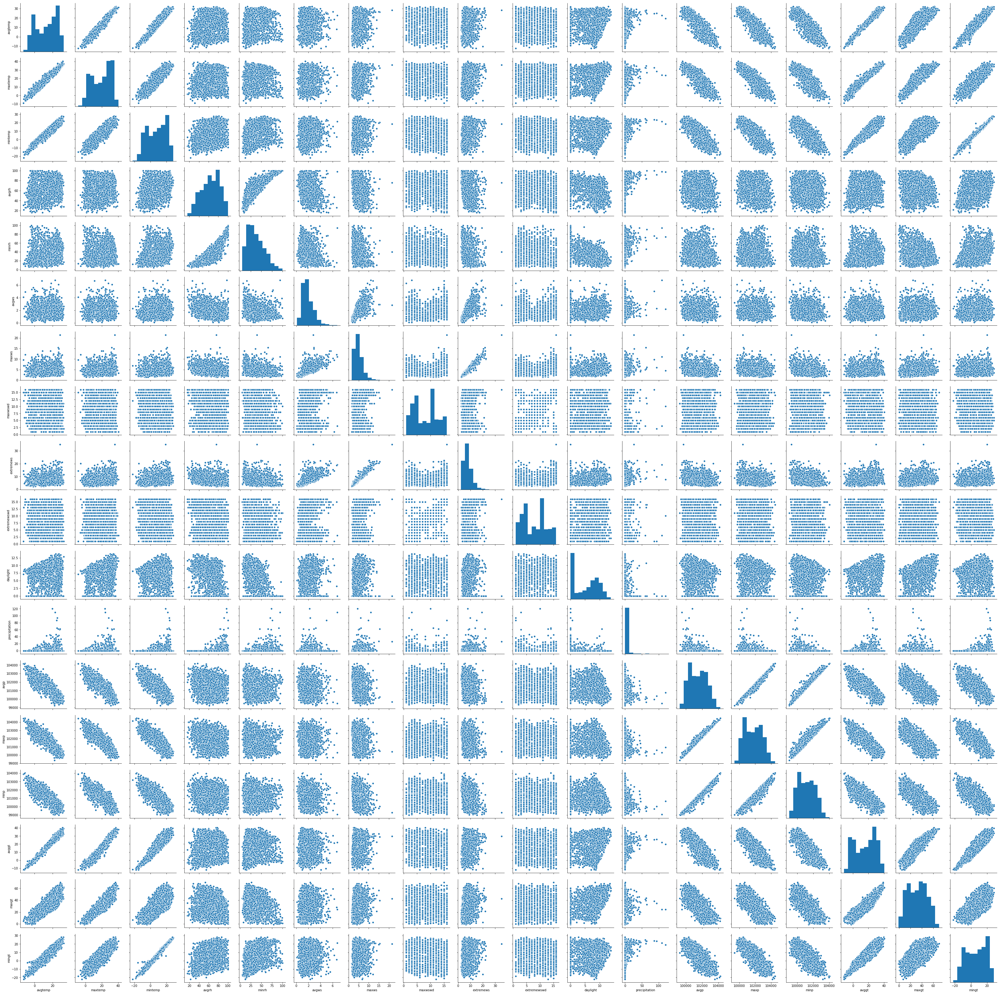

In [34]:
## 5. check colinearity
selected_continuous_variables = ['avgtemp', 'maxtemp', 'mintemp', 'avgrh', 'minrh', 'avgws', 'maxws',
       'maxwswd', 'extremews', 'extremewswd', 'daylight', 'precipitation',
       'avgp', 'maxp', 'minp', 'avggt', 'maxgt', 'mingt']
sns.pairplot(myData[selected_continuous_variables])

In [ ]:
## from the above plot, we can observe the following a few points:
# 1) data quality is pretty good, we do not see many significant outliers
# 2) there are prominant colinearities among these variables, e.g., ['avgp', 'maxp', 'minp']; ['avggt', 'maxgt', 'mingt'];
#    ['avgtemp', 'maxtemp', 'mintemp']. -> pick one of them for the modelling (e.g., the avg value of each group)

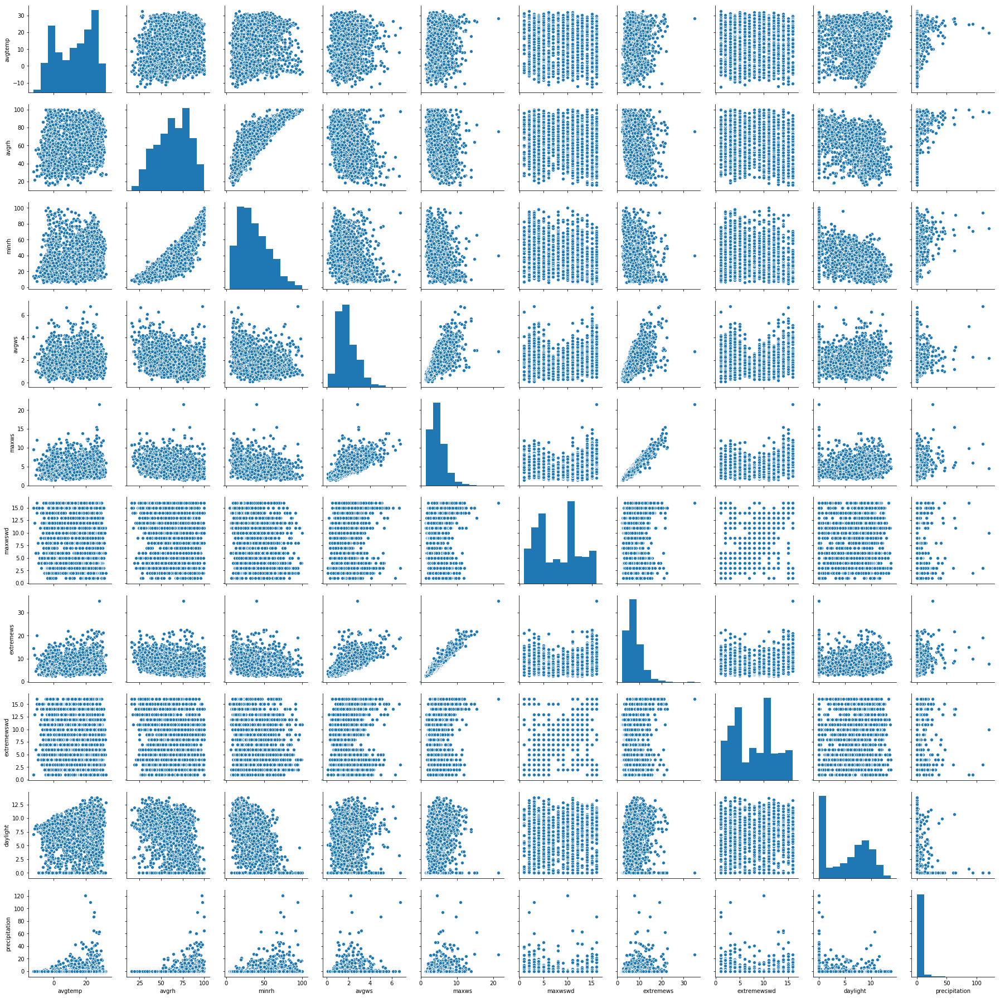

In [48]:
## removing the variables with colinearities and replot the pairplot.
selected_continuous_variables = ['avgtemp', 'avgrh', 'minrh', 'avgws', 'maxws',
       'maxwswd', 'extremews', 'extremewswd', 'daylight', 'precipitation']
sns.pairplot(myData[selected_continuous_variables])

In [49]:
## the precipitation variable is pretty skewed - usually what we do is to remove the outliers that are outside 95% 
#  percentile of the variable value's distribution (in this case we can basically remove every value that is greater
#  than 7.9 or simply set this value to all cases that is greater than it by running the last two lines of code)
print(myData['precipitation'].quantile(q=0.95))
## 7.9

## optional since precipitation of 50 - 100 are rare but still valid data
#myData['precipitation'].apply(lambda x: min(x, 7.93))

7.934999999999991


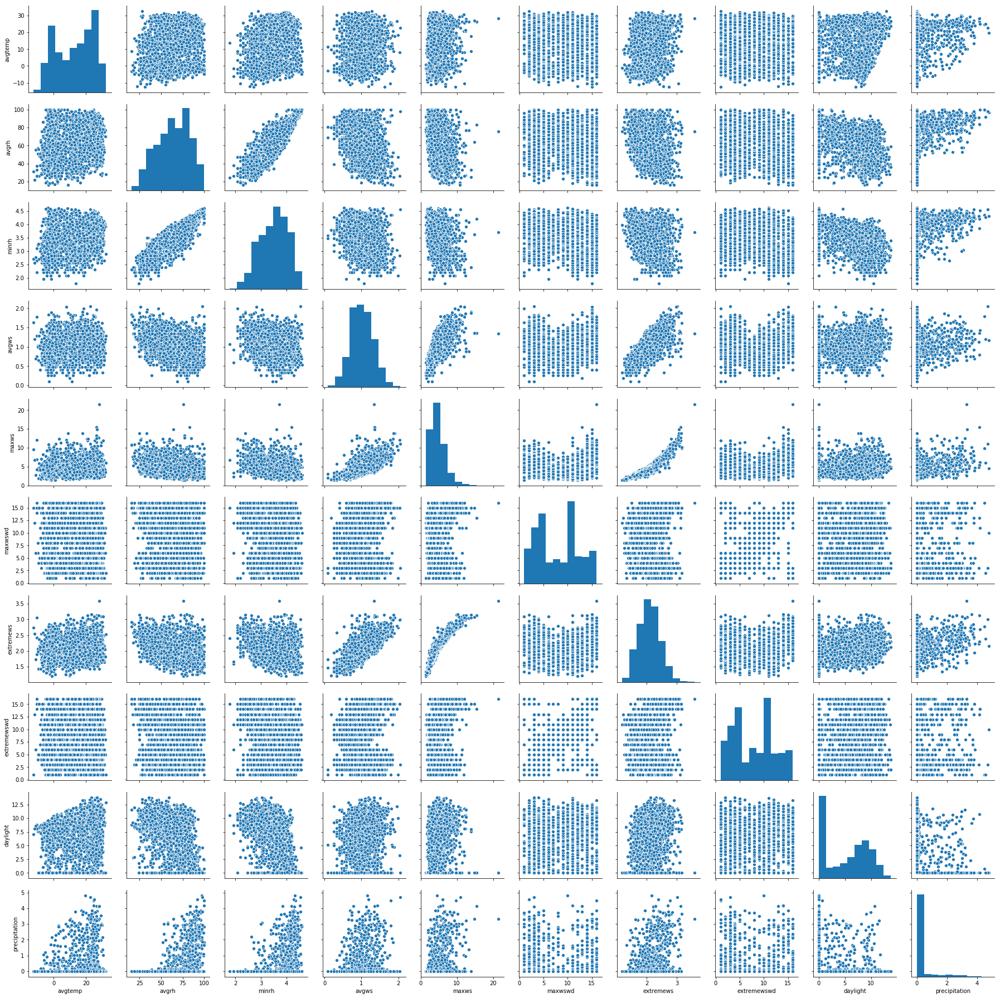

In [50]:
## 6. variable transformation
# this step is also optional
# most variables are normal or normal-like distributed except for ['minrh', 'avgws', 'extremews', 'precipitation']
# we can perform some log transformation to make every variable look normal since this is preferred or assumed by
# most statistical or Machine learning models.
cols_to_transform = ['minrh', 'avgws', 'extremews', 'precipitation']
for col in cols_to_transform:
    myData[col] = np.log(1+myData[col])
# replot the pairwise colinearity chart
sns.pairplot(myData[selected_continuous_variables])
## now every thing looks more normally distributed...

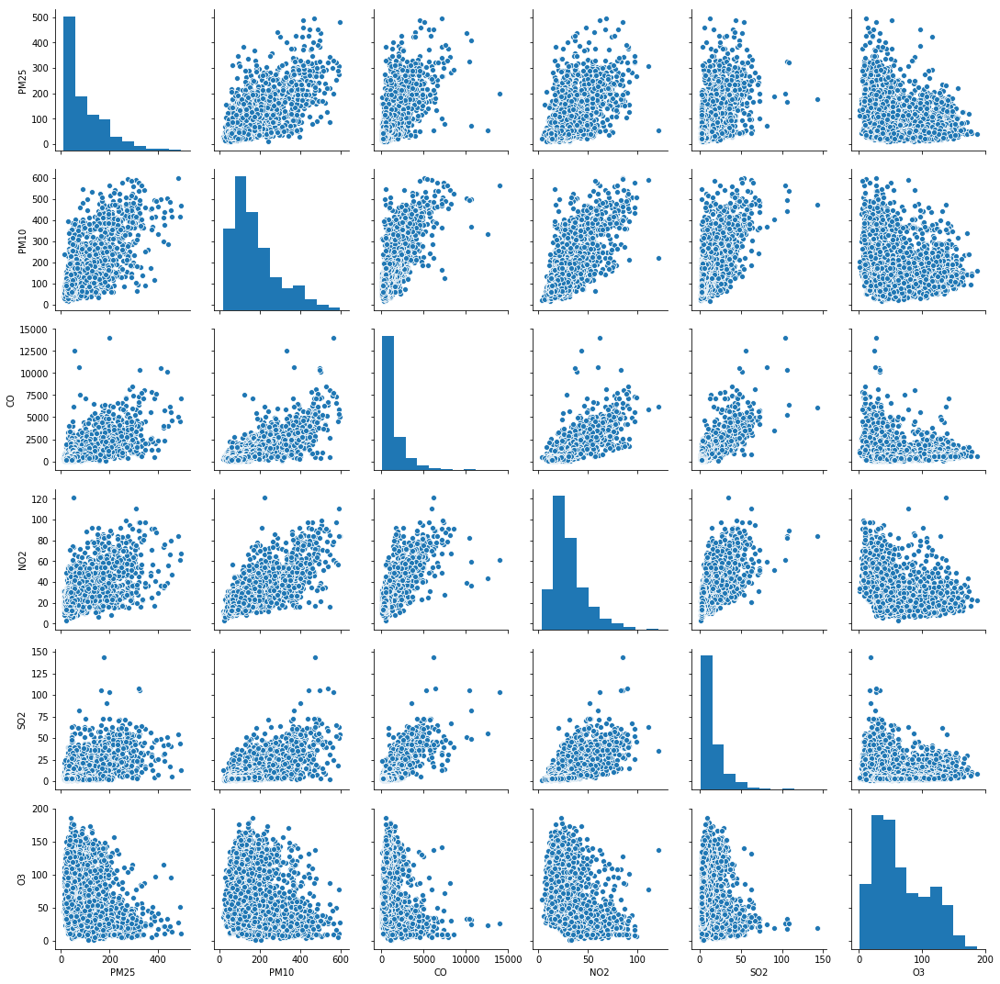

In [51]:
sns.pairplot(myData[y])

In [52]:
Y = myData[y].apply(lambda x: np.log(1+x)) ## perform similar transformation to Y's

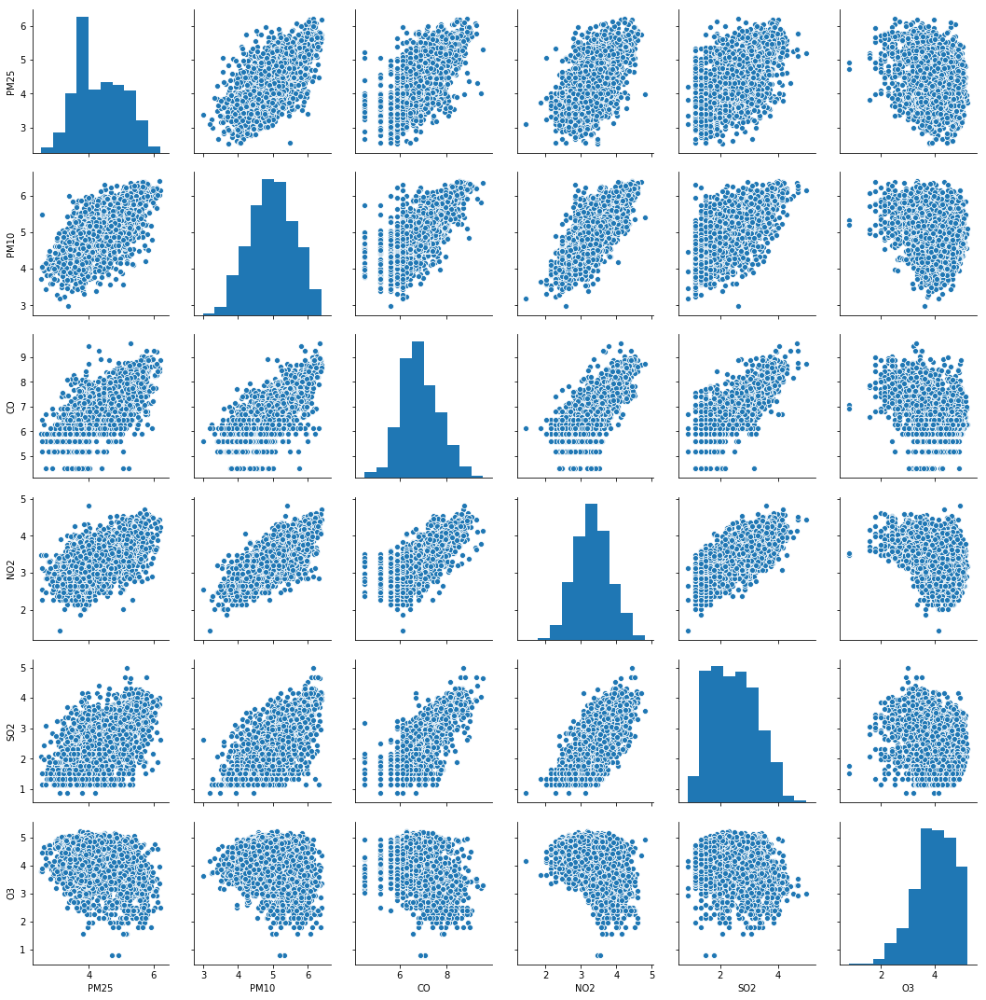

In [53]:
sns.pairplot(Y)

In [54]:
Y

,PM25,PM10,CO,NO2,SO2,O3
0,4.857484,6.280396,8.556606,4.380025,4.133565,3.433987
1,5.725218,6.140746,8.556606,4.204095,3.854394,3.305054
2,5.636574,5.981162,8.111028,4.190261,3.903991,2.602690
3,5.515443,6.082219,8.261268,4.368435,4.053523,2.917771
4,5.614951,5.898252,8.026497,4.056296,3.887730,2.397895
...,...,...,...,...,...,...
2669,3.557916,4.060443,5.602119,2.636196,1.335001,4.226834
2670,3.414114,4.356709,5.888878,2.636196,1.335001,4.208417
2671,3.897924,4.189655,5.602119,2.636196,1.335001,4.394449
2673,3.786460,4.127134,5.198497,2.636196,1.335001,4.025352


In [55]:
## 7. treating the time series variables
categorical_variables = ['year', 'month', 'day', 'week', 'season']
myData.year.unique()

array([2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021])

In [59]:
myData.season.unique()

array(['winter', 'spring', 'summer', 'fall'], dtype=object)

In [76]:
def parse_time_string_dow(time_string):
    date_time_obj = datetime.strptime(str(time_string).split(".")[0], '%Y-%m-%d')
    dow = date_time_obj.weekday()
    return dow
## converting all days to weekdays which makes more sense
myData['weekday'] = myData.apply(lambda x: parse_time_string_dow(str(x['year'])+"-"+str(x['month'])+'-'+str(x['day'])), axis=1)
# string concatenation of the first three columns -> 2014-1-1, then use the parse time string function to convert
# a specific date to weekday, i.e., Mon, Tue, Wed, etc.

In [79]:
## usually the way to treat the categorical variables are to convert them to category levels (e.g., 0,1,2), which 
#  called ordinal encoding (categories have orders); or to convert them into one-hot categories (more popular) e.g.
# winter 
#         spring
#                 summer
#                        fall
# In the above matrix, every category is treated equally.

# The variable 'week' has 52 categories, which will cause super sparse matrix, so we discard it. Don't worry, the info 
# can be captured by other variables since these are very correlated variables.

X_categorical = myData[['year', 'month', 'weekday', 'season']]
X_continuous = myData[selected_continuous_variables]

In [90]:
## convert all X_categorical to strings so we can simply make them to category levels - if not, pandas will still 
# believe they are numerical values.
X_categorical = pd.concat([myData['year'].apply(str),myData['month'].apply(str),
                          myData['weekday'].apply(str), myData['season']], axis=1)
X_categorical

,year,month,weekday,season
0,2014,1,2,winter
1,2014,1,3,winter
2,2014,1,4,winter
3,2014,1,5,winter
4,2014,1,6,winter
...,...,...,...,...
2669,2021,4,4,spring
2670,2021,4,5,spring
2671,2021,4,6,spring
2673,2021,4,1,spring


In [91]:
X_categorical = pd.get_dummies(X_categorical, drop_first=True) ## dropping a random one to aviod colinearity

In [92]:
X_categorical ## created a number of new variables - in total 27 columns

,year_2015,year_2016,year_2017,year_2018,year_2019,year_2020,year_2021,month_10,month_11,month_12,...,month_9,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,season_spring,season_summer,season_winter
0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2669,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,0,1,0,0
2670,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,1,0,1,0,0
2671,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
2673,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,1,0,0


In [100]:
## now we can concatenate both the categorical and the continuous variables together
X = pd.concat([X_categorical, X_continuous], axis=1)

In [101]:
X

,year_2015,year_2016,year_2017,year_2018,year_2019,year_2020,year_2021,month_10,month_11,month_12,...,avgtemp,avgrh,minrh,avgws,maxws,maxwswd,extremews,extremewswd,daylight,precipitation
0,0,0,0,0,0,0,0,0,0,0,...,4.4,32.0,2.833213,1.252763,6.6,14,2.261763,14,8.4,0.0
1,0,0,0,0,0,0,0,0,0,0,...,0.1,53.0,3.367296,0.741937,3.4,11,1.757858,11,6.2,0.0
2,0,0,0,0,0,0,0,0,0,0,...,-0.1,56.0,3.091042,1.029619,6.1,4,2.322388,4,7.6,0.0
3,0,0,0,0,0,0,0,0,0,0,...,-0.9,66.0,3.761200,0.955511,4.4,2,2.054124,2,6.8,0.0
4,0,0,0,0,0,0,0,0,0,0,...,-2.9,67.0,3.367296,0.788457,4.0,2,1.902108,3,7.2,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2669,0,0,0,0,0,0,1,0,0,0,...,14.6,72.0,3.891820,1.410987,6.8,6,2.484907,5,10.9,0.0
2670,0,0,0,0,0,0,1,0,0,0,...,16.2,66.0,3.931826,1.064711,3.7,4,1.887070,3,2.3,0.0
2671,0,0,0,0,0,0,1,0,0,0,...,14.5,76.0,4.025352,0.993252,3.6,8,1.824549,8,0.1,0.0
2673,0,0,0,0,0,0,1,0,0,0,...,18.0,36.0,2.484907,1.410987,7.9,15,2.624669,14,6.9,0.0


In [97]:
X.columns

Index(['year_2015', 'year_2016', 'year_2017', 'year_2018', 'year_2019',
       'year_2020', 'year_2021', 'month_10', 'month_11', 'month_12', 'month_2',
       'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8',
       'month_9', 'weekday_1', 'weekday_2', 'weekday_3', 'weekday_4',
       'weekday_5', 'weekday_6', 'season_spring', 'season_summer',
       'season_winter', 'avgtemp', 'avgrh', 'minrh', 'avgws', 'maxws',
       'maxwswd', 'extremews', 'extremewswd', 'daylight', 'precipitation'],
      dtype='object')

In [96]:
Y

,PM25,PM10,CO,NO2,SO2,O3
0,4.857484,6.280396,8.556606,4.380025,4.133565,3.433987
1,5.725218,6.140746,8.556606,4.204095,3.854394,3.305054
2,5.636574,5.981162,8.111028,4.190261,3.903991,2.602690
3,5.515443,6.082219,8.261268,4.368435,4.053523,2.917771
4,5.614951,5.898252,8.026497,4.056296,3.887730,2.397895
...,...,...,...,...,...,...
2669,3.557916,4.060443,5.602119,2.636196,1.335001,4.226834
2670,3.414114,4.356709,5.888878,2.636196,1.335001,4.208417
2671,3.897924,4.189655,5.602119,2.636196,1.335001,4.394449
2673,3.786460,4.127134,5.198497,2.636196,1.335001,4.025352


In [102]:
## 8. standardize all the X variables to stablize the model fitting
#     since some methods are value scale sensitive
scaler = preprocessing.StandardScaler()
    # Fit your data on the scaler object
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

/opt/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/opt/anaconda3/lib/python3.6/site-packages/sklearn/base.py:464: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [103]:
X

,year_2015,year_2016,year_2017,year_2018,year_2019,year_2020,year_2021,month_10,month_11,month_12,...,avgtemp,avgrh,minrh,avgws,maxws,maxwswd,extremews,extremewswd,daylight,precipitation
0,-0.414495,-0.418638,-0.397039,-0.389961,-0.383538,-0.372713,-0.219456,-0.303568,-0.282556,-0.296121,...,-0.773742,-1.704305,-1.228304,0.758559,0.932218,1.411831,0.475526,1.456861,0.739027,-0.355727
1,-0.414495,-0.418638,-0.397039,-0.389961,-0.383538,-0.372713,-0.219456,-0.303568,-0.282556,-0.296121,...,-1.153177,-0.586147,-0.247841,-0.937816,-0.685783,0.721487,-0.980817,0.756702,0.216605,-0.355727
2,-0.414495,-0.418638,-0.397039,-0.389961,-0.383538,-0.372713,-0.219456,-0.303568,-0.282556,-0.296121,...,-1.170825,-0.426410,-0.754984,0.017533,0.679405,-0.889315,0.650738,-0.877002,0.549056,-0.355727
3,-0.414495,-0.418638,-0.397039,-0.389961,-0.383538,-0.372713,-0.219456,-0.303568,-0.282556,-0.296121,...,-1.241417,0.106046,0.475284,-0.228568,-0.180158,-1.349544,-0.124575,-1.343775,0.359084,-0.355727
4,-0.414495,-0.418638,-0.397039,-0.389961,-0.383538,-0.372713,-0.219456,-0.303568,-0.282556,-0.296121,...,-1.417899,0.159292,-0.247841,-0.783330,-0.382408,-1.349544,-0.563919,-1.110388,0.454070,-0.355727
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2389,-0.414495,-0.418638,-0.397039,-0.389961,-0.383538,-0.372713,4.556713,-0.303568,-0.282556,-0.296121,...,0.126312,0.425520,0.715075,1.283997,1.033343,-0.429086,1.120436,-0.643616,1.332690,-0.355727
2390,-0.414495,-0.418638,-0.397039,-0.389961,-0.383538,-0.372713,4.556713,-0.303568,-0.282556,-0.296121,...,0.267497,0.106046,0.788516,0.134066,-0.534096,-0.889315,-0.607380,-1.110388,-0.709508,-0.355727
2391,-0.414495,-0.418638,-0.397039,-0.389961,-0.383538,-0.372713,4.556713,-0.303568,-0.282556,-0.296121,...,0.117488,0.638503,0.960210,-0.103238,-0.584658,0.031143,-0.788071,0.056543,-1.231931,-0.355727
2392,-0.414495,-0.418638,-0.397039,-0.389961,-0.383538,-0.372713,4.556713,-0.303568,-0.282556,-0.296121,...,0.426331,-1.491322,-1.867721,1.283997,1.589531,1.641945,1.524364,1.456861,0.382830,-0.355727


II Model training and prediction stage

In [113]:
myData.reset_index(inplace=True) ## unifiying the myData and X's index systems...

In [116]:
Y.reset_index(inplace=True)

In [140]:
## try using 2014-2017 as training, 2018 as testing -- and then try 2014-2018 training, 2019 testing

X_pre_2017 = X.loc[myData.loc[:,'year'] <= 2017,:]
X_2018 = X.loc[myData.loc[:,'year'] == 2018,:]
X_pre_2018 = X.loc[myData.loc[:,'year'] <= 2018,:]
X_2019 = X.loc[myData.loc[:,'year'] == 2019,:]

Y_pre_2017 = Y.loc[myData.loc[:,'year'] <= 2017,:]
Y_2018 = Y.loc[myData.loc[:,'year'] == 2018,:]
Y_pre_2018 = Y.loc[myData.loc[:,'year'] <= 2018,:]
Y_2019 = Y.loc[myData.loc[:,'year'] == 2019,:]



## merge X Y
xy = pd.concat([Y, X], axis = 1) # for later use

In [125]:
Y_2019

,index,PM25,PM10,CO,NO2,SO2,O3
1685,1826,4.982236,5.921042,8.055475,4.007333,3.210844,2.140066
1686,1827,5.519459,5.762051,7.965893,4.007333,3.152736,1.791759
1687,1828,5.391352,5.505332,7.758333,3.859466,3.058707,2.397895
1688,1829,5.156178,5.288267,7.591357,3.763987,3.091042,2.277267
1689,1830,4.928702,5.655992,7.832411,3.903991,2.954910,2.691243
...,...,...,...,...,...,...,...
1987,2183,4.662495,5.087596,7.208600,3.508556,1.987874,2.691243
1988,2184,4.796617,4.882802,6.898715,3.292870,1.887070,3.433987
1989,2185,3.990834,5.147494,7.065613,3.571221,2.312535,2.691243
1990,2186,4.298645,5.099866,7.208600,3.788725,2.240710,2.140066


In [128]:
## regression model evaluation metrics
def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    errors = abs(predictions - test_labels)
    mape = 100 * np.mean(errors / test_labels)
    accuracy = 100 - mape
    print('Model Performance')
    print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
    print('Accuracy = {:0.2f}%.'.format(accuracy))
    return accuracy

In [138]:
responses = ['PM25']
param_grid = [
            {'n_estimators': [60,80,100,120,160,200], 'max_features': [6,12,18,24]},
    ]
with open('results/'+"_R2.txt","w+") as fp:
    for response in responses:
        regr = RandomForestRegressor()
        grid_search =  GridSearchCV(regr,param_grid,cv=5,scoring='neg_mean_squared_error',return_train_score=True)
        grid_search.fit(X_pre_2017,y_pre_2017)
        print(grid_search.best_params_)
        acc = evaluate(grid_search.best_estimator_, X_pre_2017,y_pre_2017)
        y_predicted = grid_search.best_estimator_.predict(X_2018)
        Y_2018["predicted_"+response] = y_predicted
        fp.write(str(response)+"eval test accuracy: "+str(acc)+"\n")
fp.close()

pd.concat([Y_2018,X_2018], axis=1).to_csv('results/'+"predicted-PM2.5-2018.csv", index=False)

Model Performance
Average Error: 0.1416 degrees.
Accuracy = 96.78%.


/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]


In [143]:
responses = ['PM25']
param_grid = [
            {'n_estimators': [60,80,100,120,160,200], 'max_features': [6,12,18,24]},
    ]
with open('results/'+"_R2.txt","w+") as fp:
    for response in responses:
        regr = RandomForestRegressor()
        grid_search =  GridSearchCV(regr,param_grid,cv=5,scoring='neg_mean_squared_error',return_train_score=True)
        grid_search.fit(X_pre_2018,Y_pre_2018[response])
        print(grid_search.best_params_)
        training_acc = evaluate(grid_search.best_estimator_, X_pre_2018,Y_pre_2018[response])
        testing_acc = evaluate(grid_search.best_estimator_, X_2019,Y_2019[response])
        y_predicted = grid_search.best_estimator_.predict(X_2019)
        Y_2019["predicted_"+response] = y_predicted
        fp.write(str(response)+" eval training accuracy: "+str(training_acc)+"\n")
        fp.write(str(response)+" eval test accuracy: "+str(testing_acc)+"\n")
fp.close()

pd.concat([Y_2019,X_2019], axis=1).to_csv('results/'+"predicted-PM2.5-2019.csv", index=False)

{'max_features': 6, 'n_estimators': 80}
Model Performance
Average Error: 0.1420 degrees.
Accuracy = 96.73%.
Model Performance
Average Error: 0.6454 degrees.
Accuracy = 82.33%.


/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


III evaluating results

IV compiling results

In [ ]:
## wrap up code to generate all results...